# Subset EURO-CORDEX data for Ireland

In [2]:
# import libraries
import os
from datetime import datetime, timezone
import geopandas as gpd
import intake
import matplotlib.pyplot as plt
import xarray as xr
import climag.plot_configs as cplt

In [3]:
print("Last updated:", datetime.now(tz=timezone.utc))

Last updated: 2022-10-19 14:22:20.069286+00:00


In [4]:
DATA_DIR_BASE = os.path.join("data", "eurocordex")

In [5]:
# directory to store outputs
DATA_DIR = os.path.join(DATA_DIR_BASE, "IE")
os.makedirs(DATA_DIR, exist_ok=True)

In [6]:
# Cork Airport met station coords
LON = -8.48611
LAT = 51.84722

In [7]:
# Ireland boundary
GPKG_BOUNDARY = os.path.join("data", "boundary", "boundaries.gpkg")
ie = gpd.read_file(GPKG_BOUNDARY, layer="NUTS_Ireland_ITM")

## Reading the local catalogue

In [8]:
# JSON_FILE_PATH = (
#     "https://raw.githubusercontent.com/ClimAg/data/main/eurocordex/"
#     "eurocordex_eur11_local.json"
# )
JSON_FILE_PATH = os.path.join(
    DATA_DIR_BASE, "eurocordex_eur11_local_disk.json"
)

In [9]:
cordex_eur11_cat = intake.open_esm_datastore(JSON_FILE_PATH)

In [10]:
list(cordex_eur11_cat)

['EUR-11.MPI-M-MPI-ESM-LR.SMHI.SMHI-RCA4.rcp45.day',
 'EUR-11.ICHEC-EC-EARTH.SMHI.SMHI-RCA4.rcp85.day',
 'EUR-11.CNRM-CERFACS-CNRM-CM5.SMHI.SMHI-RCA4.historical.day',
 'EUR-11.MPI-M-MPI-ESM-LR.SMHI.SMHI-RCA4.historical.day',
 'EUR-11.MOHC-HadGEM2-ES.SMHI.SMHI-RCA4.rcp45.day',
 'EUR-11.MOHC-HadGEM2-ES.SMHI.SMHI-RCA4.rcp85.day',
 'EUR-11.MPI-M-MPI-ESM-LR.SMHI.SMHI-RCA4.rcp85.day',
 'EUR-11.MOHC-HadGEM2-ES.SMHI.SMHI-RCA4.historical.day',
 'EUR-11.CNRM-CERFACS-CNRM-CM5.SMHI.SMHI-RCA4.rcp85.day',
 'EUR-11.CNRM-CERFACS-CNRM-CM5.SMHI.SMHI-RCA4.rcp45.day',
 'EUR-11.ICHEC-EC-EARTH.SMHI.SMHI-RCA4.historical.day',
 'EUR-11.ICHEC-EC-EARTH.SMHI.SMHI-RCA4.rcp45.day']

In [11]:
cordex_eur11_cat

,unique
project,1
product_id,1
CORDEX_domain,1
institute_id,1
driving_model_id,4
experiment_id,3
member,2
model_id,1
rcm_version_id,2
frequency,1


In [12]:
cordex_eur11_cat.df.shape

(360, 27)

In [13]:
cordex_eur11_cat.df.head()

,project,product_id,CORDEX_domain,institute_id,driving_model_id,experiment_id,member,model_id,rcm_version_id,frequency,...,grid_label,grid_id,time_reduction,realm,level_type,time_min,time_max,path,format,opendap_url
0,CORDEX,output,EUR-11,SMHI,CNRM-CERFACS-CNRM-CM5,historical,r1i1p1,SMHI-RCA4,v1,day,...,None,None,None,None,None,19760101,19801231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
1,CORDEX,output,EUR-11,SMHI,CNRM-CERFACS-CNRM-CM5,historical,r1i1p1,SMHI-RCA4,v1,day,...,None,None,None,None,None,19810101,19851231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
2,CORDEX,output,EUR-11,SMHI,CNRM-CERFACS-CNRM-CM5,historical,r1i1p1,SMHI-RCA4,v1,day,...,None,None,None,None,None,19860101,19901231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
3,CORDEX,output,EUR-11,SMHI,CNRM-CERFACS-CNRM-CM5,historical,r1i1p1,SMHI-RCA4,v1,day,...,None,None,None,None,None,19910101,19951231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
4,CORDEX,output,EUR-11,SMHI,CNRM-CERFACS-CNRM-CM5,historical,r1i1p1,SMHI-RCA4,v1,day,...,None,None,None,None,None,19960101,20001231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...


## Read a subset (rcp85)

In [13]:
cordex_eur11 = cordex_eur11_cat.search(
    experiment_id="rcp85",
    driving_model_id="MPI-M-MPI-ESM-LR"
)

In [14]:
cordex_eur11

,unique
project,1
product_id,1
CORDEX_domain,1
institute_id,1
driving_model_id,1
experiment_id,1
member,1
model_id,1
rcm_version_id,1
frequency,1


In [15]:
cordex_eur11.df

,project,product_id,CORDEX_domain,institute_id,driving_model_id,experiment_id,member,model_id,rcm_version_id,frequency,...,grid_label,grid_id,time_reduction,realm,level_type,time_min,time_max,path,format,opendap_url
0,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20410101,20451231,data/eurocordex/SMHI/rcp85/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
1,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20460101,20501231,data/eurocordex/SMHI/rcp85/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
2,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20510101,20551231,data/eurocordex/SMHI/rcp85/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
3,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20560101,20601231,data/eurocordex/SMHI/rcp85/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
4,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20610101,20651231,data/eurocordex/SMHI/rcp85/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
5,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20660101,20701231,data/eurocordex/SMHI/rcp85/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
6,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20410101,20451231,data/eurocordex/SMHI/rcp85/mrso/mrso_EUR-11_MP...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
7,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20460101,20501231,data/eurocordex/SMHI/rcp85/mrso/mrso_EUR-11_MP...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
8,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20510101,20551231,data/eurocordex/SMHI/rcp85/mrso/mrso_EUR-11_MP...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
9,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp85,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20560101,20601231,data/eurocordex/SMHI/rcp85/mrso/mrso_EUR-11_MP...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...


In [16]:
data = xr.open_mfdataset(
    list(cordex_eur11.df["uri"]),
    chunks="auto",
    decode_coords="all"
)

In [17]:
data

<xarray.Dataset>
Dimensions:       (time: 10957, rlat: 412, rlon: 424, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(412, 424), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(412, 424), meta=np.ndarray>
  * rlat          (rlat) float64 -23.38 -23.27 -23.16 ... 21.62 21.73 21.84
  * rlon          (rlon) float64 -28.38 -28.27 -28.16 ... 17.94 18.05 18.16
    rotated_pole  |S1 b''
  * time          (time) datetime64[ns] 2041-01-01T12:00:00 ... 2070-12-31T12...
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1826, 2), meta=np.ndarray>
    height        float64 2.0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
Attributes: (12/22)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    creation_date:                  2016-06-18-T02:18:10Z
    experiment:                     RCP85
    experiment_id:                  rcp85
    driving_experiment:             MPI-M-MPI-ESM-LR, rcp85, r1i1p1
    ...                             ...
    product:                        output
    references:                     http://www.smhi.se/en/Research/Research-d...
    tracking_id:                    46177f8e-465e-402d-81f2-c0e3bb7b4c9d
    rossby_comment:                 201610: CORDEX Europe 0.11 deg | RCA4 v1a...
    rossby_run_id:                  201610
    rossby_grib_path:               /home/rossby/prod/201610/raw/

In [18]:
# copy time_bnds coordinates
data_time_bnds = data.coords["time_bnds"]

In [19]:
# copy CRS
data_crs = data.rio.crs

In [20]:
data_crs

CRS.from_wkt('GEOGCRS["undefined",BASEGEOGCRS["undefined",DATUM["World Geodetic System 1984",ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ID["EPSG",6326]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8901]]],DERIVINGCONVERSION["Pole rotation (netCDF CF convention)",METHOD["Pole rotation (netCDF CF convention)"],PARAMETER["Grid north pole latitude (netCDF CF convention)",39.25,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["Grid north pole longitude (netCDF CF convention)",-162,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["North pole grid longitude (netCDF CF convention)",0,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]],CS[ellipsoidal,2],AXIS["longitude",east,ORDER[1],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],AXIS["latitude",north,ORDER[2],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]]')

### Ireland subset

In [21]:
# clip to Ireland's boundary
data = data.rio.clip(ie.buffer(500).to_crs(data_crs))

In [22]:
# reassign time_bnds
data.coords["time_bnds"] = data_time_bnds

In [23]:
data

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 10957, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 2041-01-01T12:00:00 ... 2070-12-31T12...
    height        float64 2.0
    spatial_ref   int64 0
    rotated_pole  |S1 b''
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1826, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
Attributes: (12/22)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    creation_date:                  2016-06-18-T02:18:10Z
    experiment:                     RCP85
    experiment_id:                  rcp85
    driving_experiment:             MPI-M-MPI-ESM-LR, rcp85, r1i1p1
    ...                             ...
    product:                        output
    references:                     http://www.smhi.se/en/Research/Research-d...
    tracking_id:                    46177f8e-465e-402d-81f2-c0e3bb7b4c9d
    rossby_comment:                 201610: CORDEX Europe 0.11 deg | RCA4 v1a...
    rossby_run_id:                  201610
    rossby_grib_path:               /home/rossby/prod/201610/raw/

### Convert units

In [24]:
for v in data.data_vars:
    var_attrs = data[v].attrs  # extract attributes
    if v == "tas":
        var_attrs["units"] = "°C"  # convert K to deg C
        data[v] = data[v] - 273.15
    elif v == "rsds":
        var_attrs["units"] = "MJ m⁻² day⁻¹"  # convert W m-2 to MJ m-2 day-1
        # Allen (1998) - FAO Irrigation and Drainage Paper No. 56 (p. 45)
        # (per second to per day; then convert to mega)
        data[v] = data[v] * (60 * 60 * 24 / 1e6)
    elif v == "mrso":
        var_attrs["units"] = "mm day⁻¹"  # kg m-2 is the same as mm day-1
    elif v in ("pr", "evspsblpot"):
        var_attrs["units"] = "mm day⁻¹"  # convert kg m-2 s-1 to mm day-1
        data[v] = data[v] * 60 * 60 * 24  # (per second to per day)
    data[v].attrs = var_attrs  # reassign attributes

In [25]:
# assign attributes for the data
data.attrs["comment"] = (
    "This dataset has been clipped with the Island of Ireland's boundary. "
    "Last updated: " + str(datetime.now(tz=timezone.utc)) +
    " by nstreethran@ucc.ie."
)

In [26]:
data

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 10957, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 2041-01-01T12:00:00 ... 2070-12-31T12...
    height        float64 2.0
    spatial_ref   int64 0
    rotated_pole  |S1 b''
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1826, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    creation_date:                  2016-06-18-T02:18:10Z
    experiment:                     RCP85
    experiment_id:                  rcp85
    driving_experiment:             MPI-M-MPI-ESM-LR, rcp85, r1i1p1
    ...                             ...
    references:                     http://www.smhi.se/en/Research/Research-d...
    tracking_id:                    46177f8e-465e-402d-81f2-c0e3bb7b4c9d
    rossby_comment:                 201610: CORDEX Europe 0.11 deg | RCA4 v1a...
    rossby_run_id:                  201610
    rossby_grib_path:               /home/rossby/prod/201610/raw/
    comment:                        This dataset has been clipped with the Is...

### Export data

In [27]:
# reassign CRS
data.rio.write_crs(data_crs, inplace=True)

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 10957, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 2041-01-01T12:00:00 ... 2070-12-31T12...
    height        float64 2.0
    spatial_ref   int64 0
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1826, 2), meta=np.ndarray>
    rotated_pole  int64 0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    creation_date:                  2016-06-18-T02:18:10Z
    experiment:                     RCP85
    experiment_id:                  rcp85
    driving_experiment:             MPI-M-MPI-ESM-LR, rcp85, r1i1p1
    ...                             ...
    references:                     http://www.smhi.se/en/Research/Research-d...
    tracking_id:                    46177f8e-465e-402d-81f2-c0e3bb7b4c9d
    rossby_comment:                 201610: CORDEX Europe 0.11 deg | RCA4 v1a...
    rossby_run_id:                  201610
    rossby_grib_path:               /home/rossby/prod/201610/raw/
    comment:                        This dataset has been clipped with the Is...

In [28]:
data.rio.crs

CRS.from_wkt('GEOGCRS["undefined",BASEGEOGCRS["undefined",DATUM["World Geodetic System 1984",ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ID["EPSG",6326]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8901]]],DERIVINGCONVERSION["Pole rotation (netCDF CF convention)",METHOD["Pole rotation (netCDF CF convention)"],PARAMETER["Grid north pole latitude (netCDF CF convention)",39.25,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["Grid north pole longitude (netCDF CF convention)",-162,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["North pole grid longitude (netCDF CF convention)",0,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]],CS[ellipsoidal,2],AXIS["longitude",east,ORDER[1],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],AXIS["latitude",north,ORDER[2],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]]')

In [29]:
# export to NetCDF
FILE_NAME = cplt.ie_cordex_ncfile_name(data)
data.to_netcdf(os.path.join(DATA_DIR, FILE_NAME))

### Time subset

In [30]:
data_ie = data.sel(
    time=[
        str(year) + "-06-21T12:00:00.000000000" for year in sorted(
            list(set(data["time"].dt.year.values))
        )
    ]
)

In [31]:
data_ie

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 30, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 2041-06-21T12:00:00 ... 2070-06-21T12...
    height        float64 2.0
    spatial_ref   int64 0
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(5, 2), meta=np.ndarray>
    rotated_pole  int64 0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    creation_date:                  2016-06-18-T02:18:10Z
    experiment:                     RCP85
    experiment_id:                  rcp85
    driving_experiment:             MPI-M-MPI-ESM-LR, rcp85, r1i1p1
    ...                             ...
    references:                     http://www.smhi.se/en/Research/Research-d...
    tracking_id:                    46177f8e-465e-402d-81f2-c0e3bb7b4c9d
    rossby_comment:                 201610: CORDEX Europe 0.11 deg | RCA4 v1a...
    rossby_run_id:                  201610
    rossby_grib_path:               /home/rossby/prod/201610/raw/
    comment:                        This dataset has been clipped with the Is...

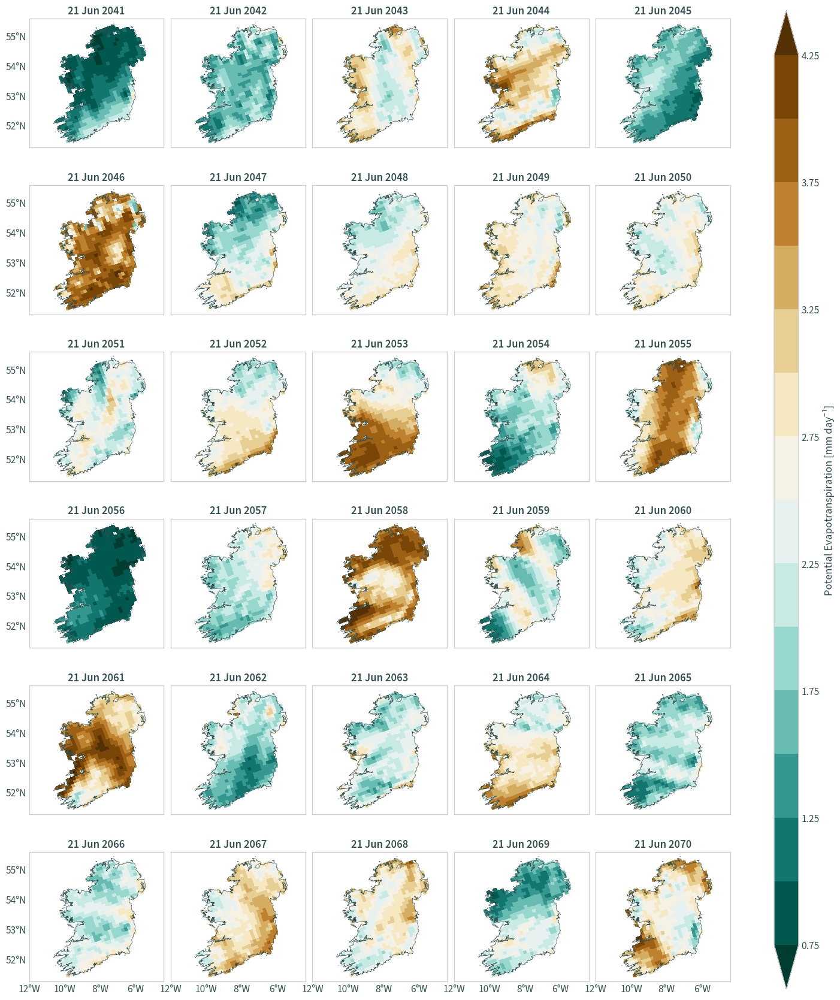

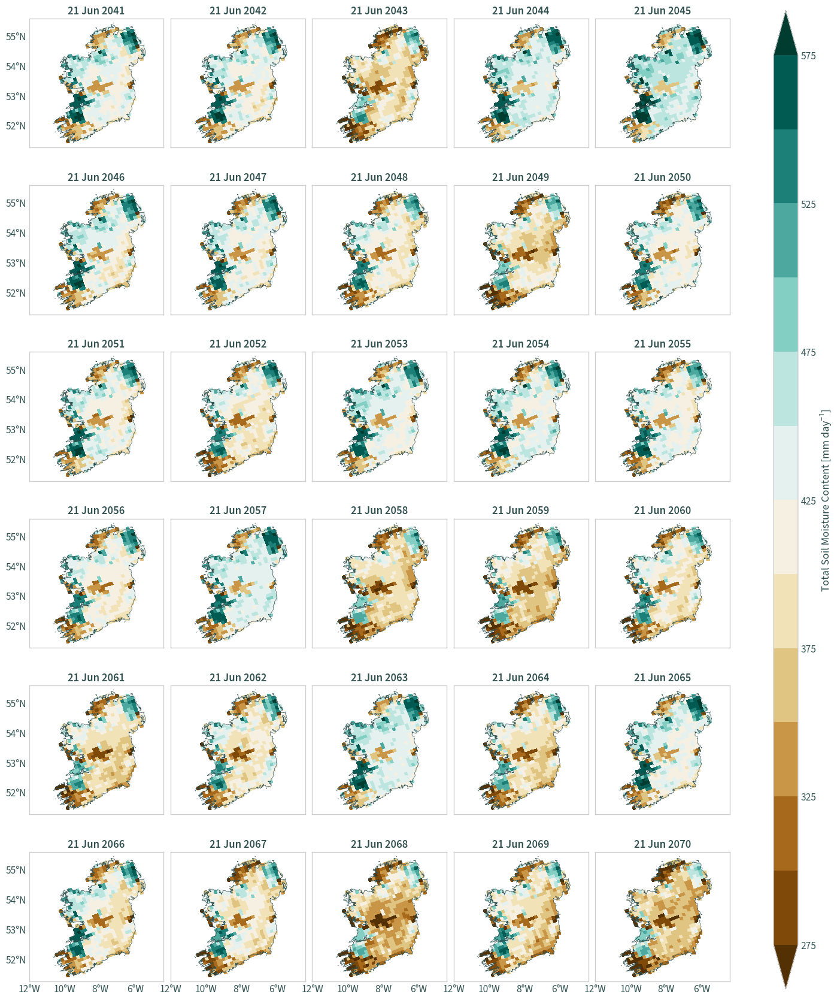

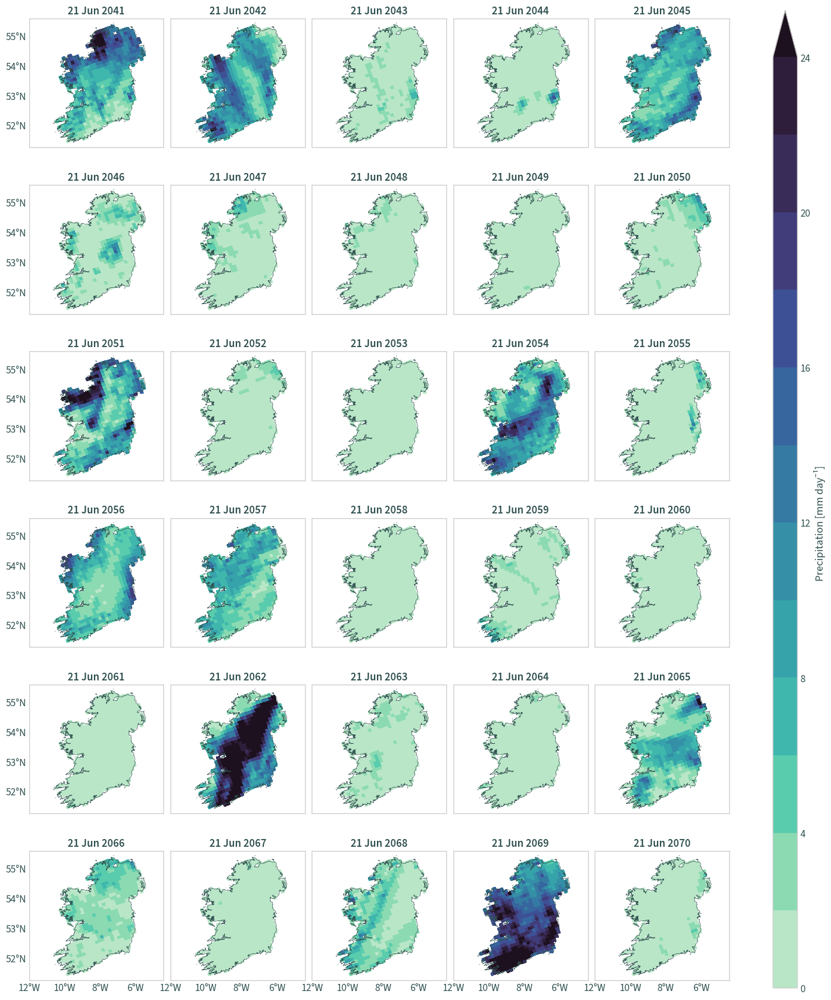

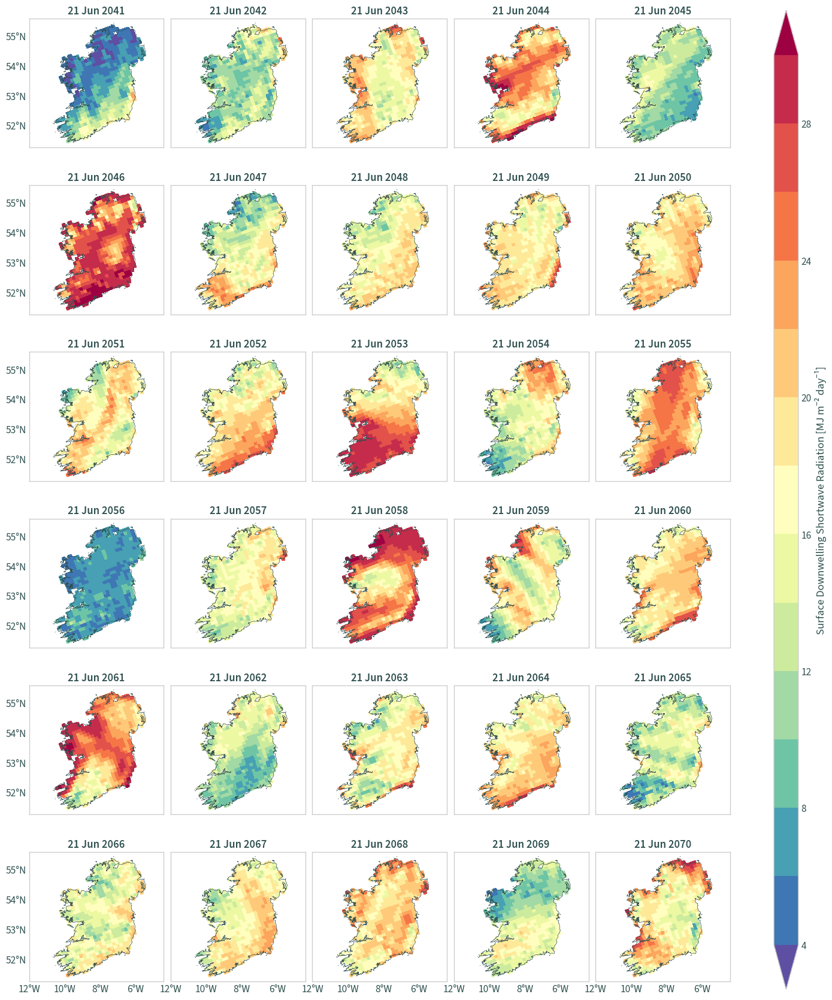

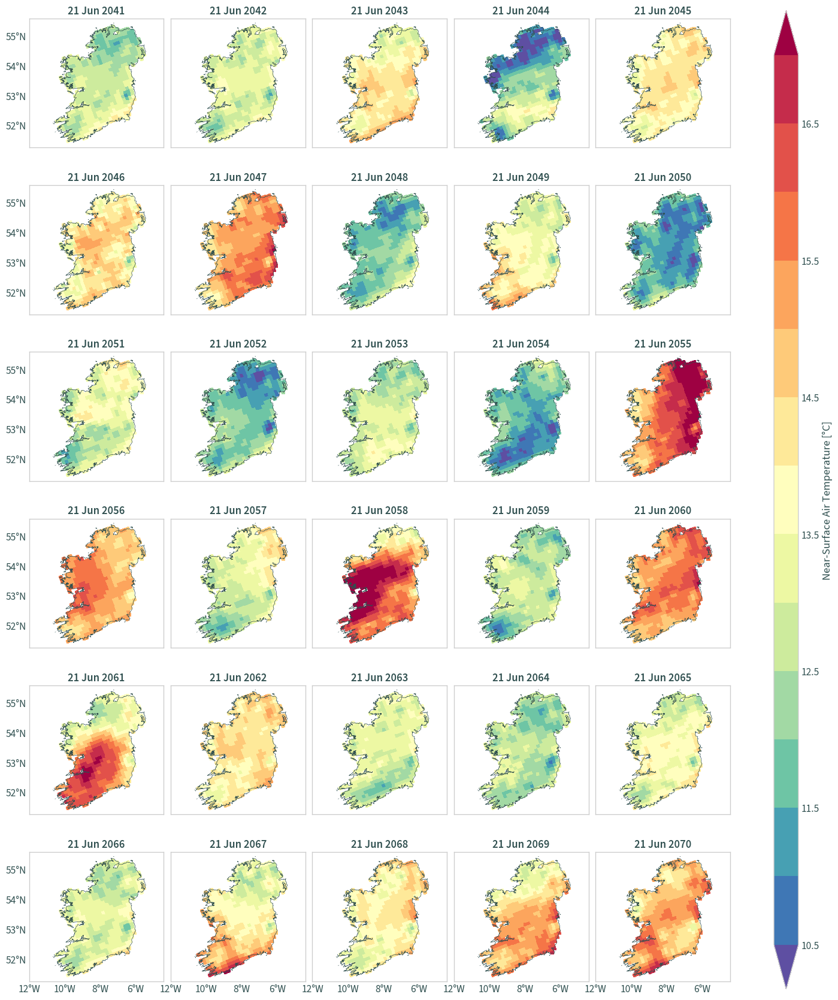

In [32]:
cplt.plot_facet_map_variables(data_ie, ie)

In [33]:
data_ie = data.sel(time="2055-06-21T12:00:00.000000000")

In [34]:
data_ie

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
    time          datetime64[ns] 2055-06-21T12:00:00
    height        float64 2.0
    spatial_ref   int64 0
    time_bnds     (bnds) datetime64[ns] dask.array<chunksize=(2,), meta=np.ndarray>
    rotated_pole  int64 0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
    mrso          (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
    pr            (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
    rsds          (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
    tas           (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    creation_date:                  2016-06-18-T02:18:10Z
    experiment:                     RCP85
    experiment_id:                  rcp85
    driving_experiment:             MPI-M-MPI-ESM-LR, rcp85, r1i1p1
    ...                             ...
    references:                     http://www.smhi.se/en/Research/Research-d...
    tracking_id:                    46177f8e-465e-402d-81f2-c0e3bb7b4c9d
    rossby_comment:                 201610: CORDEX Europe 0.11 deg | RCA4 v1a...
    rossby_run_id:                  201610
    rossby_grib_path:               /home/rossby/prod/201610/raw/
    comment:                        This dataset has been clipped with the Is...

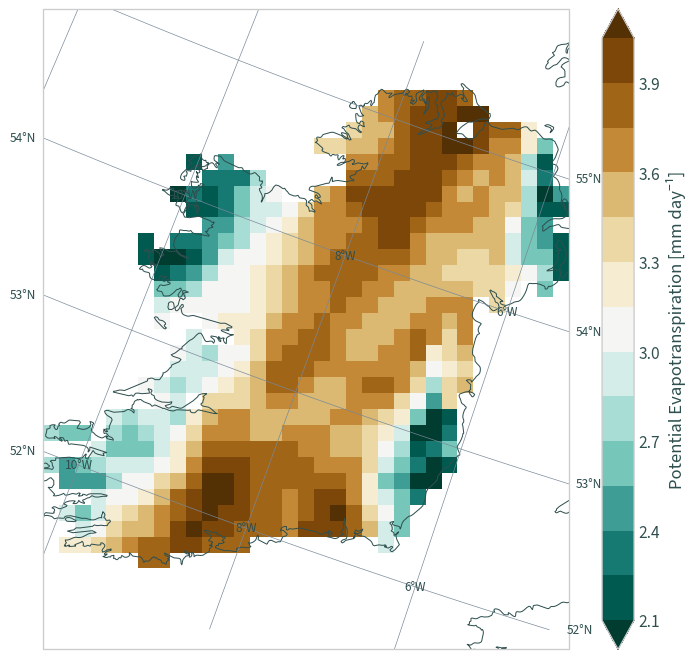

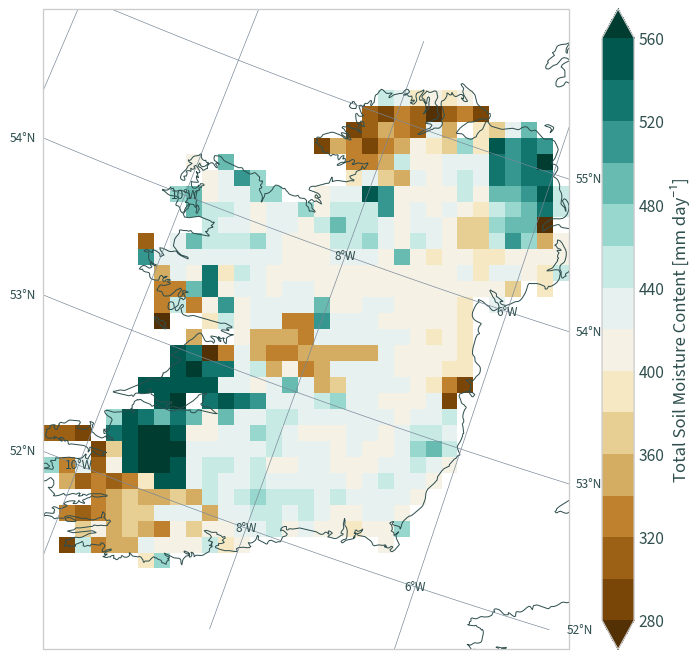

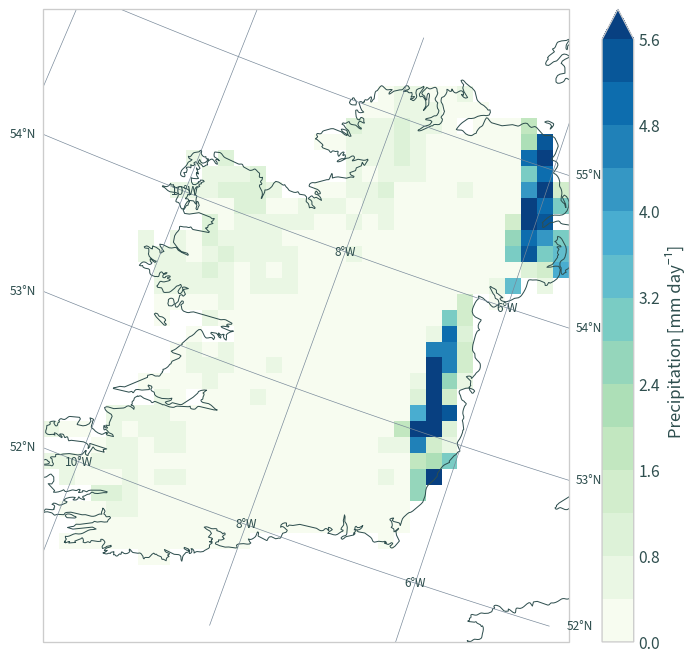

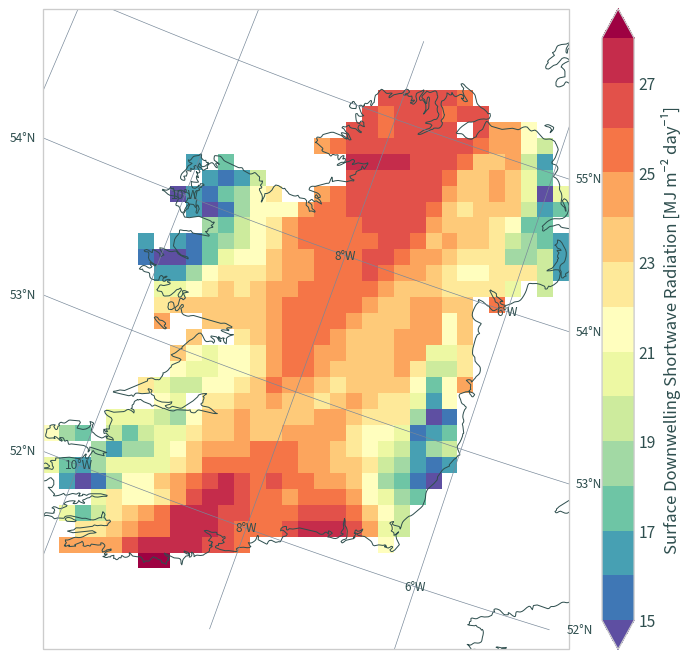

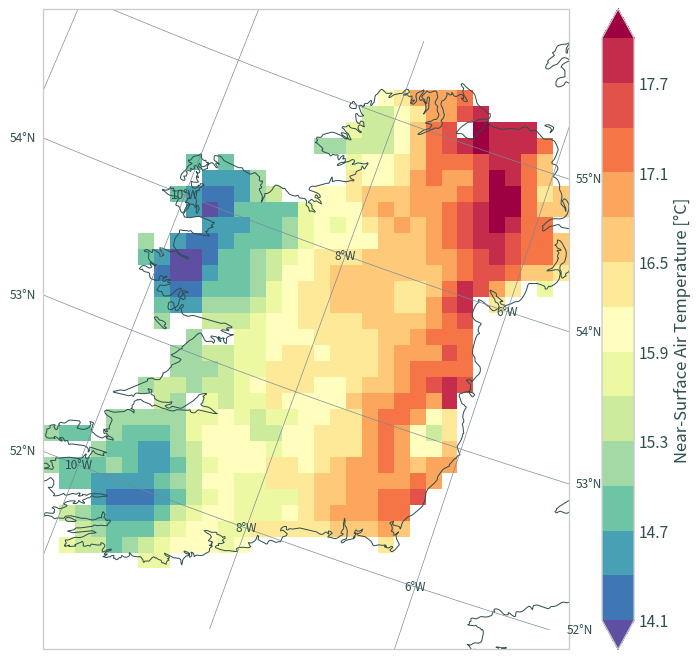

In [35]:
cplt.plot_map_variables(data_ie)

### Point subset

In [36]:
# using Cork Airport met station coordinates
cds = cplt.rotated_pole_point(data=data, lon=LON, lat=LAT)

In [37]:
data_ie = data.sel({"rlon": cds[0], "rlat": cds[1]}, method="nearest")

In [38]:
data_ie

<xarray.Dataset>
Dimensions:       (time: 10957, bnds: 2)
Coordinates:
    lat           float64 dask.array<chunksize=(), meta=np.ndarray>
    lon           float64 dask.array<chunksize=(), meta=np.ndarray>
    rlat          float64 4.015
    rlon          float64 -16.05
  * time          (time) datetime64[ns] 2041-01-01T12:00:00 ... 2070-12-31T12...
    height        float64 2.0
    spatial_ref   int64 0
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1826, 2), meta=np.ndarray>
    rotated_pole  int64 0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
    mrso          (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
    pr            (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
    rsds          (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
    tas           (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    creation_date:                  2016-06-18-T02:18:10Z
    experiment:                     RCP85
    experiment_id:                  rcp85
    driving_experiment:             MPI-M-MPI-ESM-LR, rcp85, r1i1p1
    ...                             ...
    references:                     http://www.smhi.se/en/Research/Research-d...
    tracking_id:                    46177f8e-465e-402d-81f2-c0e3bb7b4c9d
    rossby_comment:                 201610: CORDEX Europe 0.11 deg | RCA4 v1a...
    rossby_run_id:                  201610
    rossby_grib_path:               /home/rossby/prod/201610/raw/
    comment:                        This dataset has been clipped with the Is...

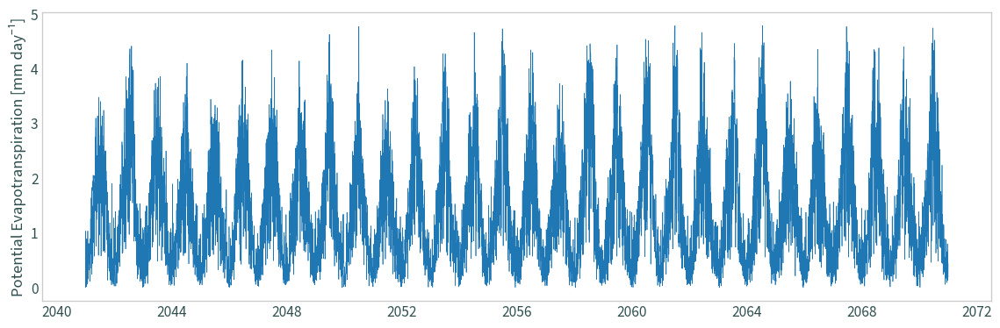

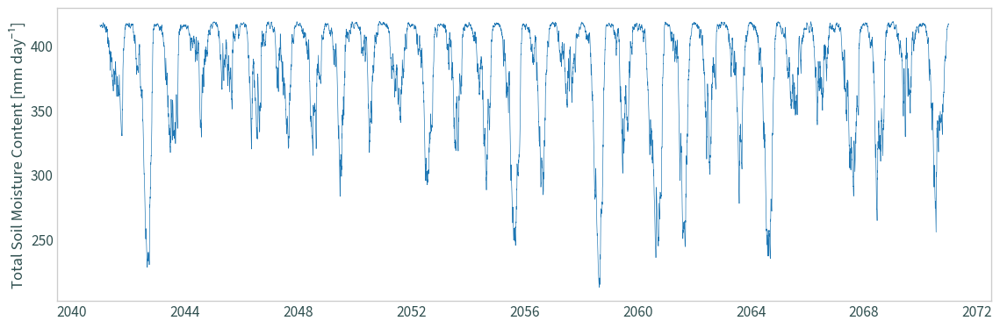

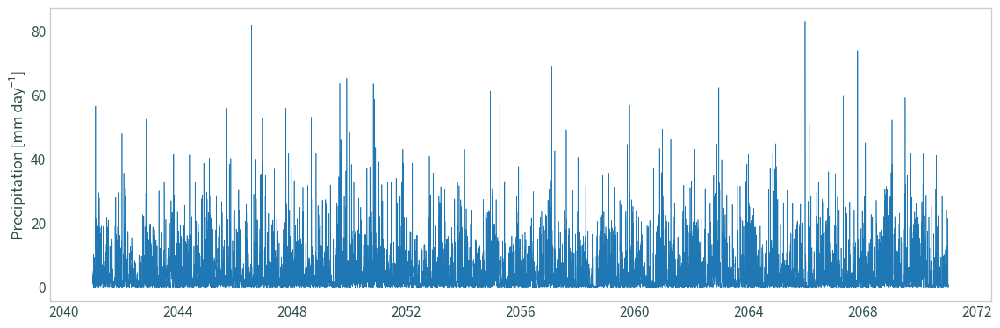

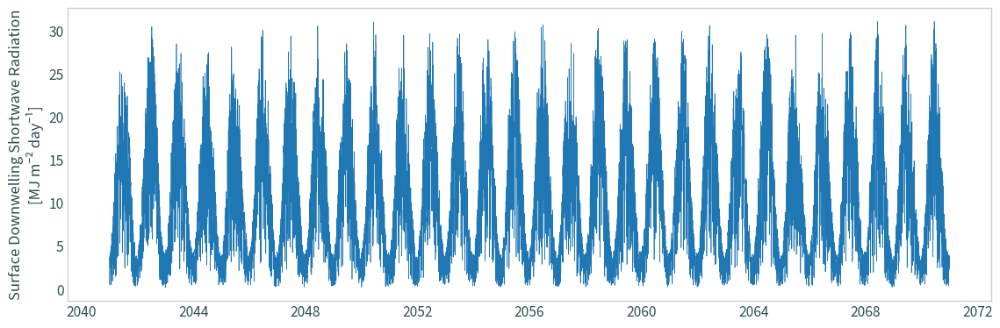

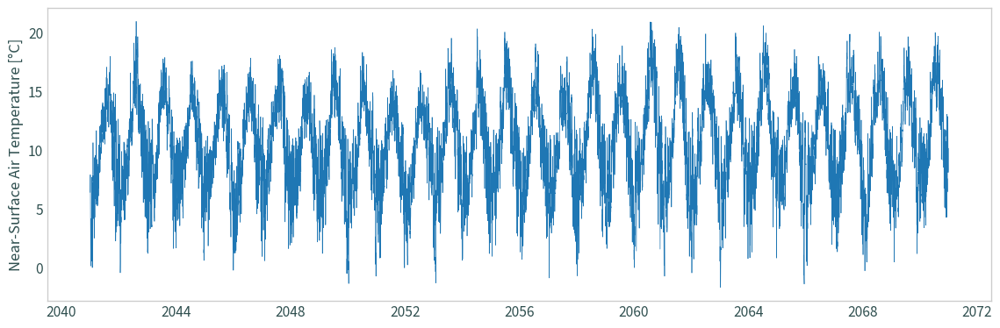

In [39]:
for v in data_ie.data_vars:
    plt.figure(figsize=(12, 4))
    plt.plot(data_ie["time"], data_ie[v], linewidth=.5)
    # plt.xlabel(data_ie["time"].attrs["standard_name"].capitalize())
    # plt.title(cplt.cordex_plot_title(data_ie, lon=LON, lat=LAT))
    if v == "rsds":
        ylabel = (
            f"{data_ie[v].attrs['long_name']}\n[{data_ie[v].attrs['units']}]"
        )
    else:
        ylabel = (
            f"{data_ie[v].attrs['long_name']} [{data_ie[v].attrs['units']}]"
        )
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.show()

## Read a subset (rcp45)

In [41]:
cordex_eur11 = cordex_eur11_cat.search(
    experiment_id="rcp45",
    driving_model_id="MPI-M-MPI-ESM-LR"
)

In [42]:
cordex_eur11

,unique
project,1
product_id,1
CORDEX_domain,1
institute_id,1
driving_model_id,1
experiment_id,1
member,1
model_id,1
rcm_version_id,1
frequency,1


In [43]:
cordex_eur11.df

,project,product_id,CORDEX_domain,institute_id,driving_model_id,experiment_id,member,model_id,rcm_version_id,frequency,...,grid_label,grid_id,time_reduction,realm,level_type,time_min,time_max,path,format,opendap_url
0,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20410101,20451231,data/eurocordex/SMHI/rcp45/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
1,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20460101,20501231,data/eurocordex/SMHI/rcp45/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
2,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20510101,20551231,data/eurocordex/SMHI/rcp45/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
3,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20560101,20601231,data/eurocordex/SMHI/rcp45/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
4,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20610101,20651231,data/eurocordex/SMHI/rcp45/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
5,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20660101,20701231,data/eurocordex/SMHI/rcp45/evspsblpot/evspsblp...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
6,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20410101,20451231,data/eurocordex/SMHI/rcp45/mrso/mrso_EUR-11_MP...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
7,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20460101,20501231,data/eurocordex/SMHI/rcp45/mrso/mrso_EUR-11_MP...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
8,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20510101,20551231,data/eurocordex/SMHI/rcp45/mrso/mrso_EUR-11_MP...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
9,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,rcp45,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20560101,20601231,data/eurocordex/SMHI/rcp45/mrso/mrso_EUR-11_MP...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...


In [ ]:
data = xr.open_mfdataset(
    list(cordex_eur11.df["uri"]),
    chunks="auto",
    decode_coords="all"
)

In [ ]:
data

In [ ]:
# copy time_bnds coordinates
data_time_bnds = data.coords["time_bnds"]

In [ ]:
# copy CRS
data_crs = data.rio.crs

In [ ]:
data_crs

### Ireland subset

In [ ]:
# clip to Ireland's boundary
data = data.rio.clip(ie.buffer(500).to_crs(data_crs))

In [ ]:
# reassign time_bnds
data.coords["time_bnds"] = data_time_bnds

In [ ]:
data

### Convert units

In [ ]:
for v in data.data_vars:
    var_attrs = data[v].attrs  # extract attributes
    if v == "tas":
        var_attrs["units"] = "°C"  # convert K to deg C
        data[v] = data[v] - 273.15
    elif v == "rsds":
        var_attrs["units"] = "MJ m⁻² day⁻¹"  # convert W m-2 to MJ m-2 day-1
        # Allen (1998) - FAO Irrigation and Drainage Paper No. 56 (p. 45)
        # (per second to per day; then convert to mega)
        data[v] = data[v] * (60 * 60 * 24 / 1e6)
    elif v == "mrso":
        var_attrs["units"] = "mm day⁻¹"  # kg m-2 is the same as mm day-1
    elif v in ("pr", "evspsblpot"):
        var_attrs["units"] = "mm day⁻¹"  # convert kg m-2 s-1 to mm day-1
        data[v] = data[v] * 60 * 60 * 24  # (per second to per day)
    data[v].attrs = var_attrs  # reassign attributes

In [ ]:
# assign attributes for the data
data.attrs["comment"] = (
    "This dataset has been clipped with the Island of Ireland's boundary. "
    "Last updated: " + str(datetime.now(tz=timezone.utc)) +
    " by nstreethran@ucc.ie."
)

In [ ]:
data

### Export data

In [ ]:
# reassign CRS
data.rio.write_crs(data_crs, inplace=True)

In [ ]:
data.rio.crs

In [ ]:
# export to NetCDF
FILE_NAME = cplt.ie_cordex_ncfile_name(data)
data.to_netcdf(os.path.join(DATA_DIR, FILE_NAME))

### Time subset

In [ ]:
data_ie = data.sel(
    time=[
        str(year) + "-06-21T12:00:00.000000000" for year in sorted(
            list(set(data["time"].dt.year.values))
        )
    ]
)

In [ ]:
data_ie

In [ ]:
cplt.plot_facet_map_variables(data_ie, ie)

In [ ]:
data_ie = data.sel(time="2055-06-21T12:00:00.000000000")

In [ ]:
data_ie

In [ ]:
cplt.plot_map_variables(data_ie)

### Point subset

In [ ]:
# using Cork Airport met station coordinates
cds = cplt.rotated_pole_point(data=data, lon=LON, lat=LAT)

In [ ]:
data_ie = data.sel({"rlon": cds[0], "rlat": cds[1]}, method="nearest")

In [ ]:
data_ie

In [ ]:
for v in data_ie.data_vars:
    plt.figure(figsize=(12, 4))
    plt.plot(data_ie["time"], data_ie[v], linewidth=.5)
    # plt.xlabel(data_ie["time"].attrs["standard_name"].capitalize())
    # plt.title(cplt.cordex_plot_title(data_ie, lon=LON, lat=LAT))
    if v == "rsds":
        ylabel = (
            f"{data_ie[v].attrs['long_name']}\n[{data_ie[v].attrs['units']}]"
        )
    else:
        ylabel = (
            f"{data_ie[v].attrs['long_name']} [{data_ie[v].attrs['units']}]"
        )
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.show()

## Read a subset (historical)

In [14]:
cordex_eur11 = cordex_eur11_cat.search(
    experiment_id="historical",
    driving_model_id="MPI-M-MPI-ESM-LR"
)

In [15]:
cordex_eur11

,unique
project,1
product_id,1
CORDEX_domain,1
institute_id,1
driving_model_id,1
experiment_id,1
member,1
model_id,1
rcm_version_id,1
frequency,1


In [16]:
cordex_eur11.df

,project,product_id,CORDEX_domain,institute_id,driving_model_id,experiment_id,member,model_id,rcm_version_id,frequency,...,grid_label,grid_id,time_reduction,realm,level_type,time_min,time_max,path,format,opendap_url
0,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,19760101,19801231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
1,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,19810101,19851231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
2,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,19860101,19901231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
3,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,19910101,19951231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
4,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,19960101,20001231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
5,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,20010101,20051231,data/eurocordex/SMHI/historical/evspsblpot/evs...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
6,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,19760101,19801231,data/eurocordex/SMHI/historical/mrso/mrso_EUR-...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
7,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,19810101,19851231,data/eurocordex/SMHI/historical/mrso/mrso_EUR-...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
8,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,19860101,19901231,data/eurocordex/SMHI/historical/mrso/mrso_EUR-...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...
9,CORDEX,output,EUR-11,SMHI,MPI-M-MPI-ESM-LR,historical,r1i1p1,SMHI-RCA4,v1a,day,...,None,None,None,None,None,19910101,19951231,data/eurocordex/SMHI/historical/mrso/mrso_EUR-...,netcdf,http://esgf1.dkrz.de/thredds/dodsC/cordex/EUR-...


In [17]:
data = xr.open_mfdataset(
    list(cordex_eur11.df["uri"]),
    chunks="auto",
    decode_coords="all"
)

In [18]:
data

<xarray.Dataset>
Dimensions:       (time: 10958, rlat: 412, rlon: 424, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(412, 424), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(412, 424), meta=np.ndarray>
  * rlat          (rlat) float64 -23.38 -23.27 -23.16 ... 21.62 21.73 21.84
  * rlon          (rlon) float64 -28.38 -28.27 -28.16 ... 17.94 18.05 18.16
    rotated_pole  |S1 b''
  * time          (time) datetime64[ns] 1976-01-01T12:00:00 ... 2005-12-31T12...
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1827, 2), meta=np.ndarray>
    height        float64 2.0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(862, 194, 200), meta=np.ndarray>
Attributes: (12/22)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    experiment:                     historical
    experiment_id:                  historical
    driving_experiment:             MPI-M-MPI-ESM-LR, historical, r1i1p1
    driving_model_id:               MPI-M-MPI-ESM-LR
    ...                             ...
    rossby_grib_path:               /nobackup/rossby16/rossby/joint_exp/corde...
    creation_date:                  2016-07-18-T17:30:56Z
    rossby_comment:                 201620: CORDEX Europe 0.11 deg | RCA4 v1 ...
    rossby_run_id:                  201620
    rcm_version_id:                 v1a
    tracking_id:                    a00328d3-2516-484d-856f-8ef2e909d434

In [19]:
# copy time_bnds coordinates
data_time_bnds = data.coords["time_bnds"]

In [20]:
# copy CRS
data_crs = data.rio.crs

In [21]:
data_crs

CRS.from_wkt('GEOGCRS["undefined",BASEGEOGCRS["undefined",DATUM["World Geodetic System 1984",ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ID["EPSG",6326]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8901]]],DERIVINGCONVERSION["Pole rotation (netCDF CF convention)",METHOD["Pole rotation (netCDF CF convention)"],PARAMETER["Grid north pole latitude (netCDF CF convention)",39.25,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["Grid north pole longitude (netCDF CF convention)",-162,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["North pole grid longitude (netCDF CF convention)",0,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]],CS[ellipsoidal,2],AXIS["longitude",east,ORDER[1],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],AXIS["latitude",north,ORDER[2],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]]')

### Ireland subset

In [22]:
# clip to Ireland's boundary
data = data.rio.clip(ie.buffer(500).to_crs(data_crs))

In [23]:
# reassign time_bnds
data.coords["time_bnds"] = data_time_bnds

In [24]:
data

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 10958, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 1976-01-01T12:00:00 ... 2005-12-31T12...
    height        float64 2.0
    spatial_ref   int64 0
    rotated_pole  |S1 b''
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1827, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
Attributes: (12/22)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    experiment:                     historical
    experiment_id:                  historical
    driving_experiment:             MPI-M-MPI-ESM-LR, historical, r1i1p1
    driving_model_id:               MPI-M-MPI-ESM-LR
    ...                             ...
    rossby_grib_path:               /nobackup/rossby16/rossby/joint_exp/corde...
    creation_date:                  2016-07-18-T17:30:56Z
    rossby_comment:                 201620: CORDEX Europe 0.11 deg | RCA4 v1 ...
    rossby_run_id:                  201620
    rcm_version_id:                 v1a
    tracking_id:                    a00328d3-2516-484d-856f-8ef2e909d434

### Convert units

In [25]:
for v in data.data_vars:
    var_attrs = data[v].attrs  # extract attributes
    if v == "tas":
        var_attrs["units"] = "°C"  # convert K to deg C
        data[v] = data[v] - 273.15
    elif v == "rsds":
        var_attrs["units"] = "MJ m⁻² day⁻¹"  # convert W m-2 to MJ m-2 day-1
        # Allen (1998) - FAO Irrigation and Drainage Paper No. 56 (p. 45)
        # (per second to per day; then convert to mega)
        data[v] = data[v] * (60 * 60 * 24 / 1e6)
    elif v == "mrso":
        var_attrs["units"] = "mm day⁻¹"  # kg m-2 is the same as mm day-1
    elif v in ("pr", "evspsblpot"):
        var_attrs["units"] = "mm day⁻¹"  # convert kg m-2 s-1 to mm day-1
        data[v] = data[v] * 60 * 60 * 24  # (per second to per day)
    data[v].attrs = var_attrs  # reassign attributes

In [26]:
# assign attributes for the data
data.attrs["comment"] = (
    "This dataset has been clipped with the Island of Ireland's boundary. "
    "Last updated: " + str(datetime.now(tz=timezone.utc)) +
    " by nstreethran@ucc.ie."
)

In [27]:
data

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 10958, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 1976-01-01T12:00:00 ... 2005-12-31T12...
    height        float64 2.0
    spatial_ref   int64 0
    rotated_pole  |S1 b''
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1827, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    experiment:                     historical
    experiment_id:                  historical
    driving_experiment:             MPI-M-MPI-ESM-LR, historical, r1i1p1
    driving_model_id:               MPI-M-MPI-ESM-LR
    ...                             ...
    creation_date:                  2016-07-18-T17:30:56Z
    rossby_comment:                 201620: CORDEX Europe 0.11 deg | RCA4 v1 ...
    rossby_run_id:                  201620
    rcm_version_id:                 v1a
    tracking_id:                    a00328d3-2516-484d-856f-8ef2e909d434
    comment:                        This dataset has been clipped with the Is...

### Export data

In [28]:
# reassign CRS
data.rio.write_crs(data_crs, inplace=True)

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 10958, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 1976-01-01T12:00:00 ... 2005-12-31T12...
    height        float64 2.0
    spatial_ref   int64 0
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1827, 2), meta=np.ndarray>
    rotated_pole  int64 0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(862, 30, 33), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    experiment:                     historical
    experiment_id:                  historical
    driving_experiment:             MPI-M-MPI-ESM-LR, historical, r1i1p1
    driving_model_id:               MPI-M-MPI-ESM-LR
    ...                             ...
    creation_date:                  2016-07-18-T17:30:56Z
    rossby_comment:                 201620: CORDEX Europe 0.11 deg | RCA4 v1 ...
    rossby_run_id:                  201620
    rcm_version_id:                 v1a
    tracking_id:                    a00328d3-2516-484d-856f-8ef2e909d434
    comment:                        This dataset has been clipped with the Is...

In [29]:
data.rio.crs

CRS.from_wkt('GEOGCRS["undefined",BASEGEOGCRS["undefined",DATUM["World Geodetic System 1984",ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ID["EPSG",6326]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8901]]],DERIVINGCONVERSION["Pole rotation (netCDF CF convention)",METHOD["Pole rotation (netCDF CF convention)"],PARAMETER["Grid north pole latitude (netCDF CF convention)",39.25,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["Grid north pole longitude (netCDF CF convention)",-162,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["North pole grid longitude (netCDF CF convention)",0,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]],CS[ellipsoidal,2],AXIS["longitude",east,ORDER[1],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],AXIS["latitude",north,ORDER[2],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]]')

In [30]:
# export to NetCDF
FILE_NAME = cplt.ie_cordex_ncfile_name(data)
data.to_netcdf(os.path.join(DATA_DIR, FILE_NAME))

### Time subset

In [31]:
data_ie = data.sel(
    time=[
        str(year) + "-06-21T12:00:00.000000000" for year in sorted(
            list(set(data["time"].dt.year.values))
        )
    ]
)

In [32]:
data_ie

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 30, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 1976-06-21T12:00:00 ... 2005-06-21T12...
    height        float64 2.0
    spatial_ref   int64 0
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(5, 2), meta=np.ndarray>
    rotated_pole  int64 0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
    mrso          (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(2, 30, 33), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    experiment:                     historical
    experiment_id:                  historical
    driving_experiment:             MPI-M-MPI-ESM-LR, historical, r1i1p1
    driving_model_id:               MPI-M-MPI-ESM-LR
    ...                             ...
    creation_date:                  2016-07-18-T17:30:56Z
    rossby_comment:                 201620: CORDEX Europe 0.11 deg | RCA4 v1 ...
    rossby_run_id:                  201620
    rcm_version_id:                 v1a
    tracking_id:                    a00328d3-2516-484d-856f-8ef2e909d434
    comment:                        This dataset has been clipped with the Is...

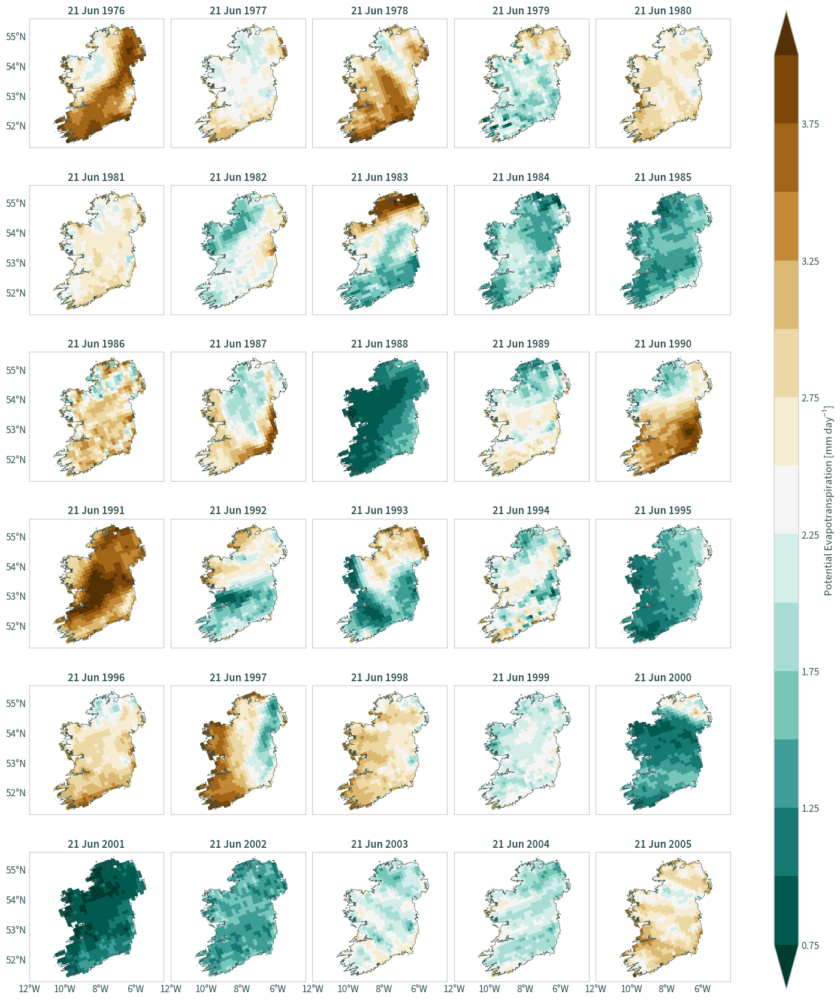

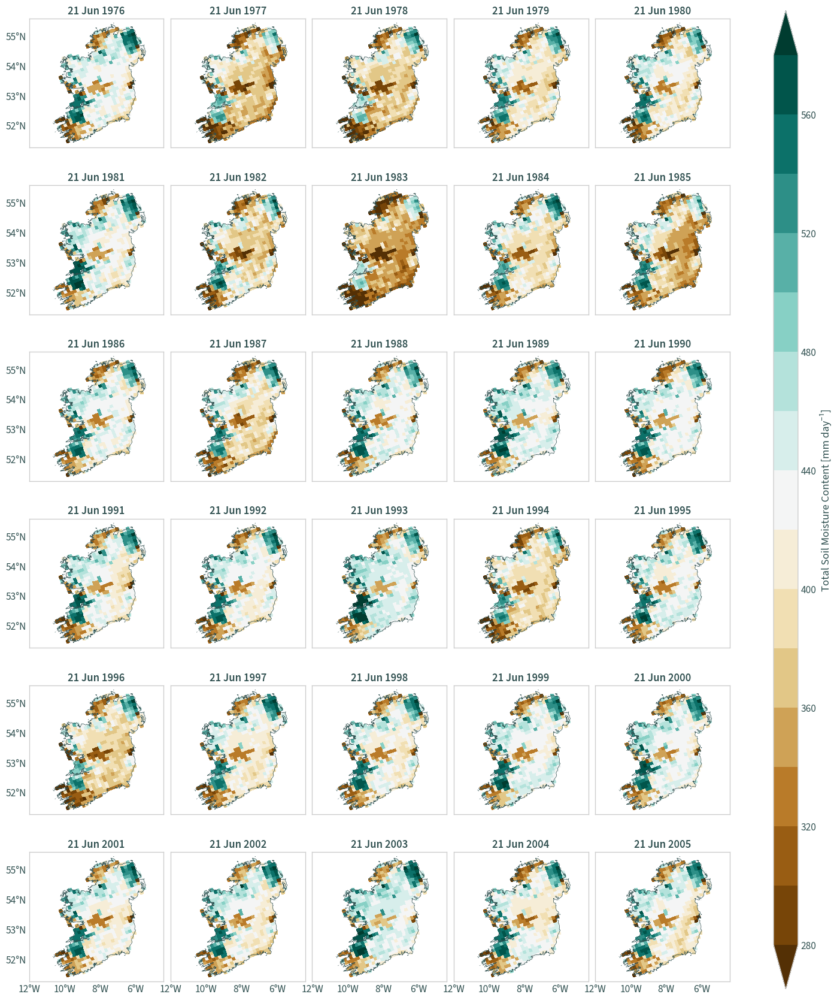

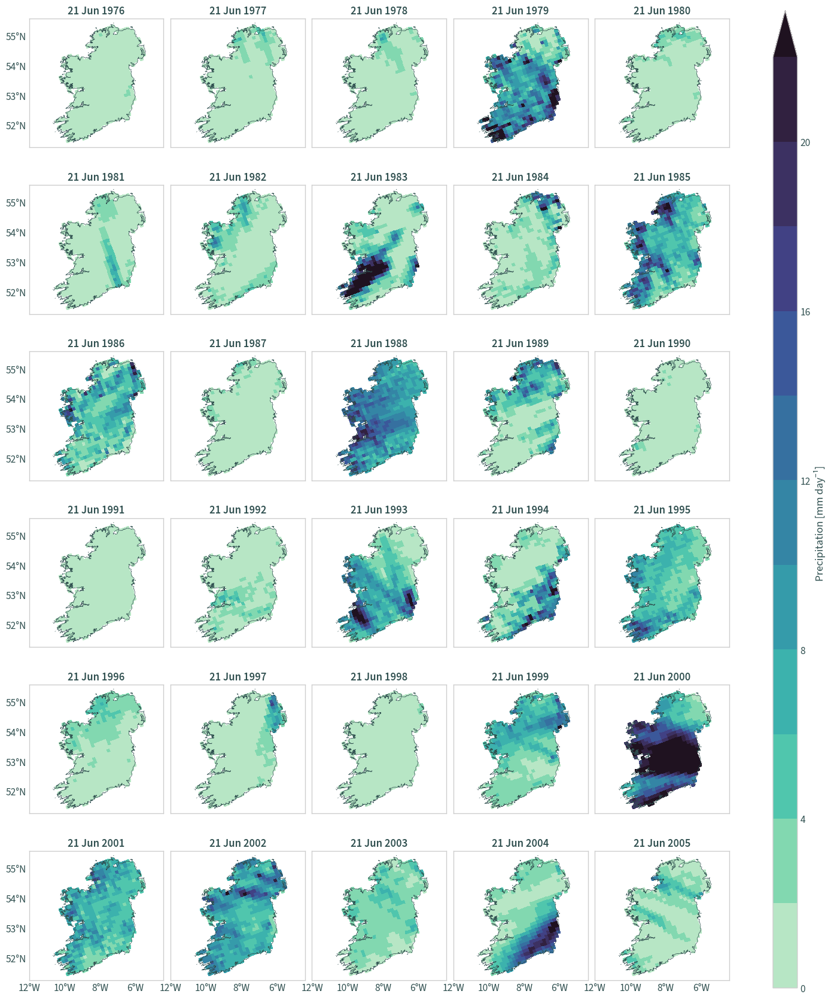

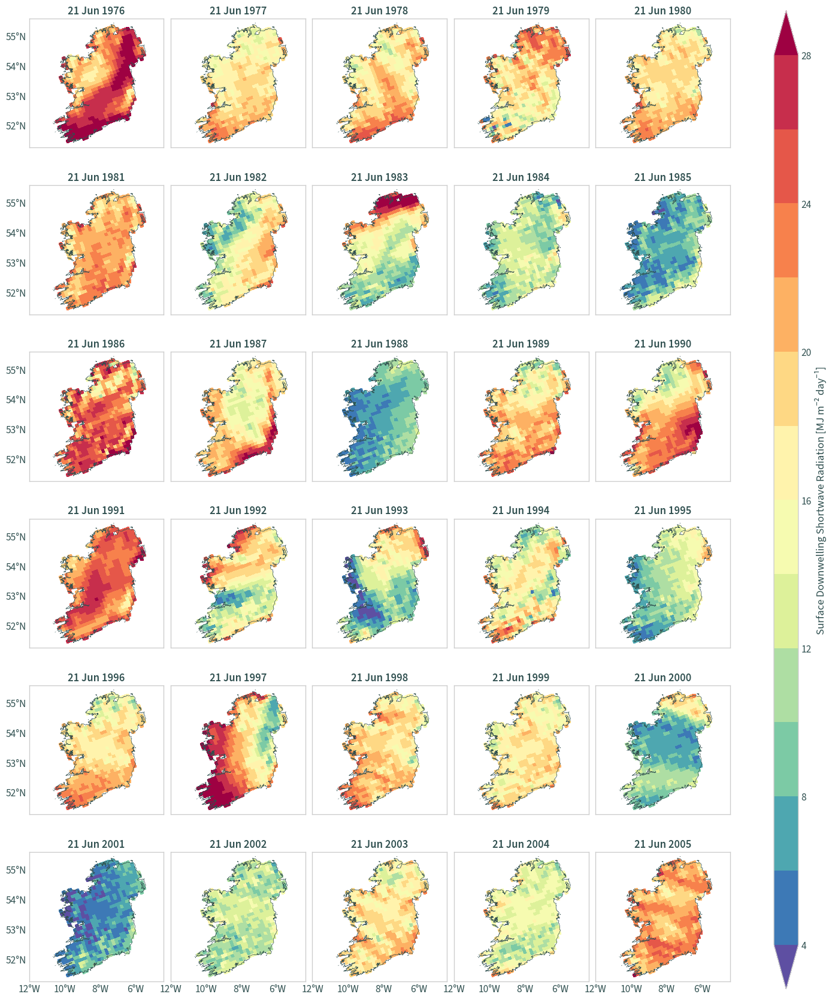

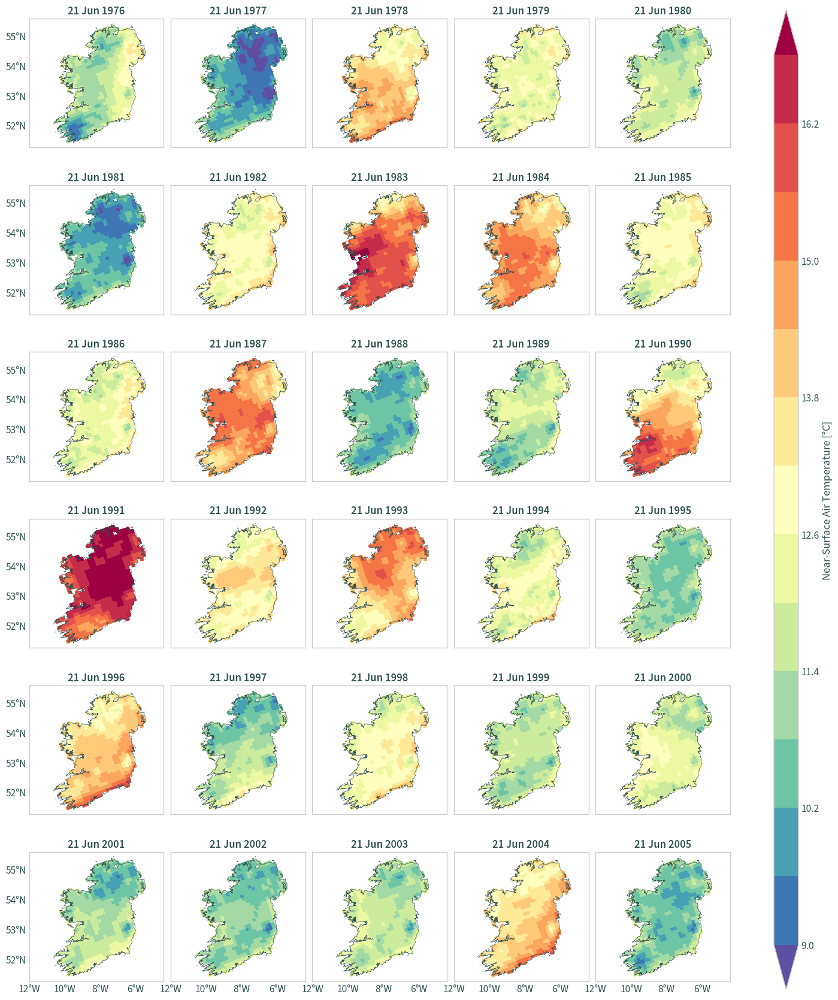

In [33]:
cplt.plot_facet_map_variables(data_ie, ie)

In [34]:
data_ie = data.sel(time="1990-06-21T12:00:00.000000000")

In [35]:
data_ie

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
    time          datetime64[ns] 1990-06-21T12:00:00
    height        float64 2.0
    spatial_ref   int64 0
    time_bnds     (bnds) datetime64[ns] dask.array<chunksize=(2,), meta=np.ndarray>
    rotated_pole  int64 0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
    mrso          (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
    pr            (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
    rsds          (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
    tas           (rlat, rlon) float32 dask.array<chunksize=(30, 33), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    experiment:                     historical
    experiment_id:                  historical
    driving_experiment:             MPI-M-MPI-ESM-LR, historical, r1i1p1
    driving_model_id:               MPI-M-MPI-ESM-LR
    ...                             ...
    creation_date:                  2016-07-18-T17:30:56Z
    rossby_comment:                 201620: CORDEX Europe 0.11 deg | RCA4 v1 ...
    rossby_run_id:                  201620
    rcm_version_id:                 v1a
    tracking_id:                    a00328d3-2516-484d-856f-8ef2e909d434
    comment:                        This dataset has been clipped with the Is...

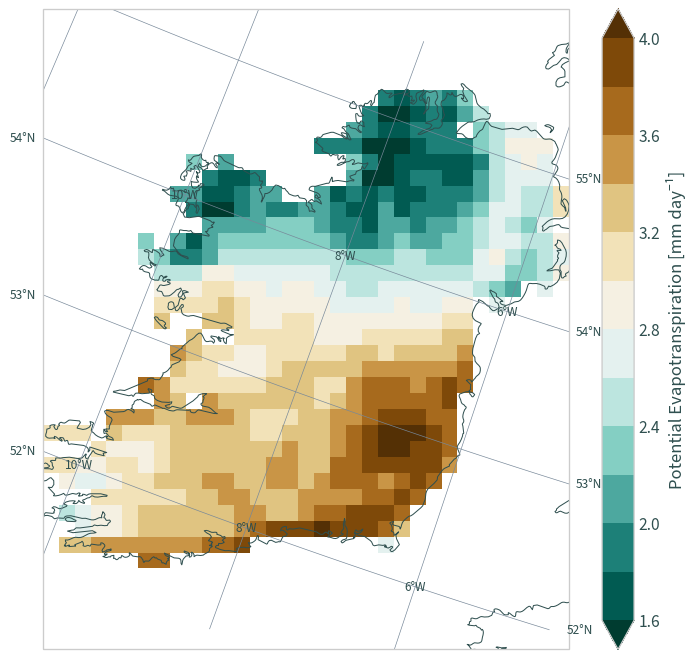

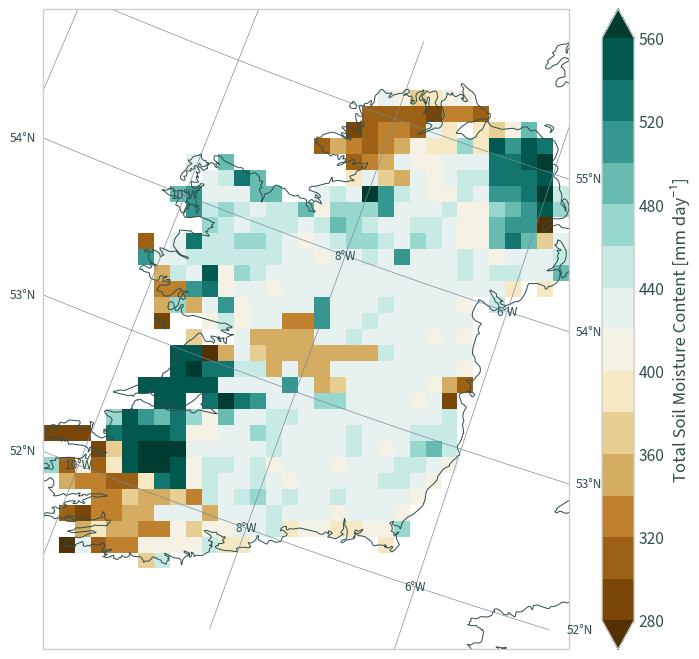

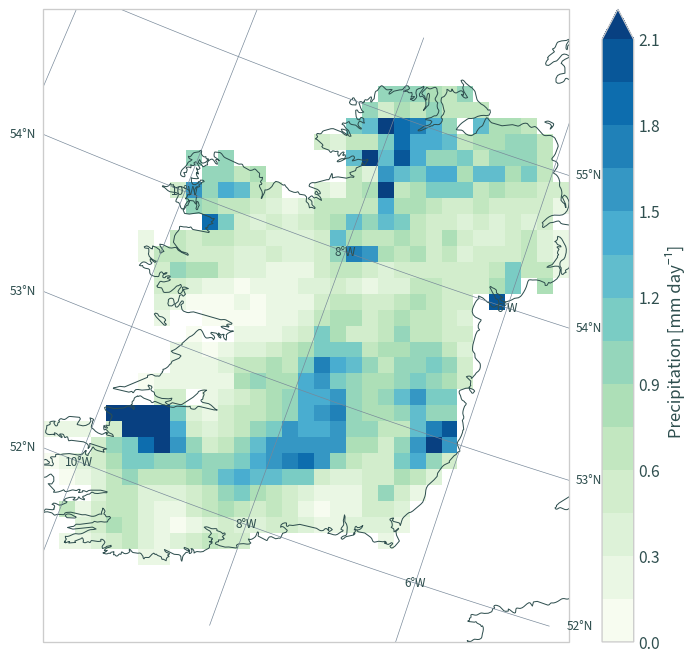

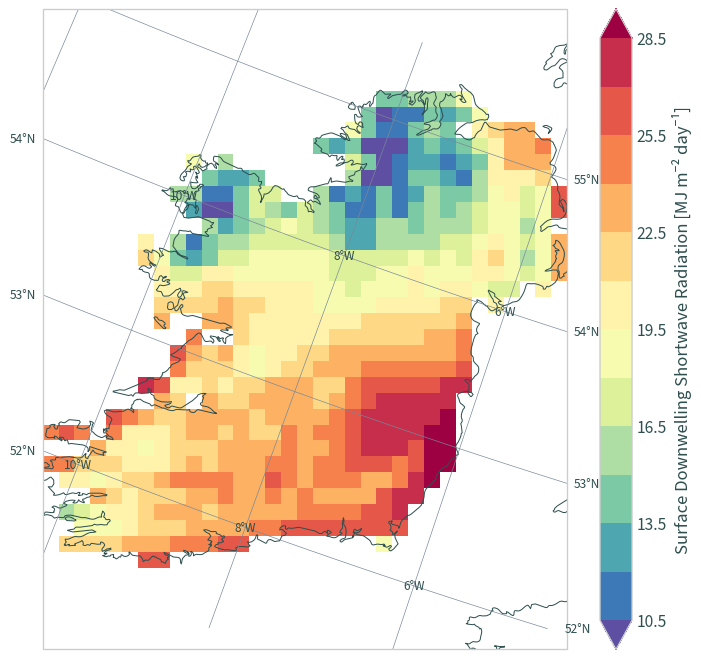

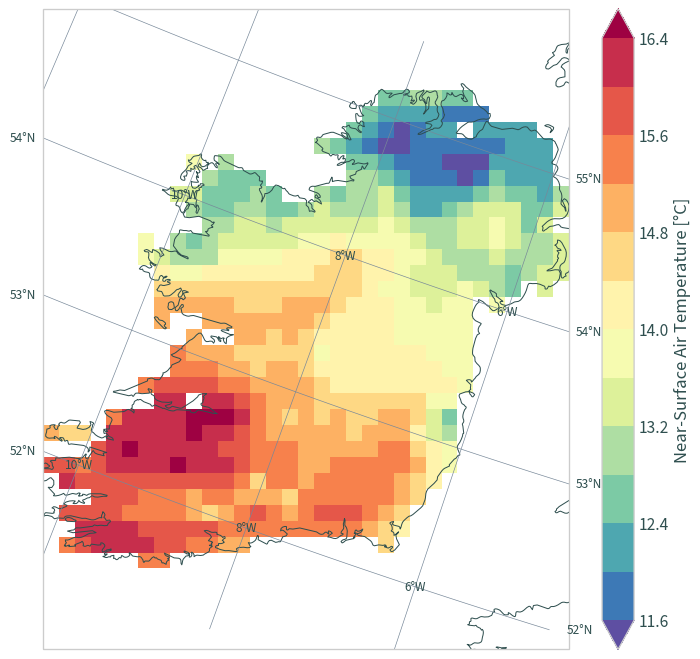

In [36]:
cplt.plot_map_variables(data_ie)

### Point subset

In [37]:
# using Cork Airport met station coordinates
cds = cplt.rotated_pole_point(data=data, lon=LON, lat=LAT)

In [38]:
data_ie = data.sel({"rlon": cds[0], "rlat": cds[1]}, method="nearest")

In [39]:
data_ie

<xarray.Dataset>
Dimensions:       (time: 10958, bnds: 2)
Coordinates:
    lat           float64 dask.array<chunksize=(), meta=np.ndarray>
    lon           float64 dask.array<chunksize=(), meta=np.ndarray>
    rlat          float64 4.015
    rlon          float64 -16.05
  * time          (time) datetime64[ns] 1976-01-01T12:00:00 ... 2005-12-31T12...
    height        float64 2.0
    spatial_ref   int64 0
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(1827, 2), meta=np.ndarray>
    rotated_pole  int64 0
Dimensions without coordinates: bnds
Data variables:
    evspsblpot    (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
    mrso          (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
    pr            (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
    rsds          (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
    tas           (time) float32 dask.array<chunksize=(862,), meta=np.ndarray>
Attributes: (12/23)
    Conventions:                    CF-1.4
    contact:                        rossby.cordex@smhi.se
    experiment:                     historical
    experiment_id:                  historical
    driving_experiment:             MPI-M-MPI-ESM-LR, historical, r1i1p1
    driving_model_id:               MPI-M-MPI-ESM-LR
    ...                             ...
    creation_date:                  2016-07-18-T17:30:56Z
    rossby_comment:                 201620: CORDEX Europe 0.11 deg | RCA4 v1 ...
    rossby_run_id:                  201620
    rcm_version_id:                 v1a
    tracking_id:                    a00328d3-2516-484d-856f-8ef2e909d434
    comment:                        This dataset has been clipped with the Is...

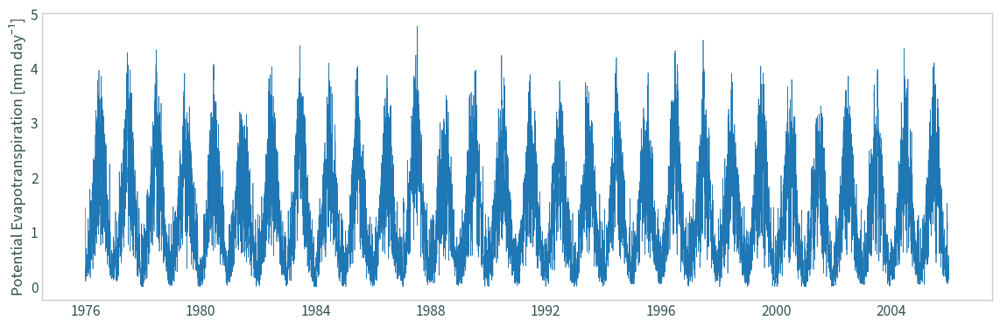

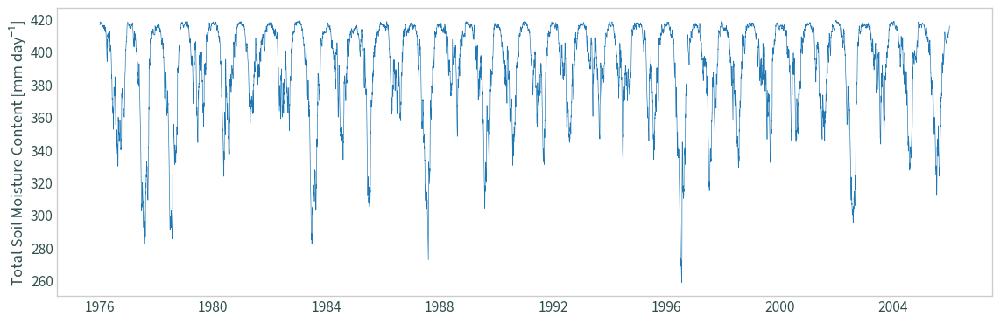

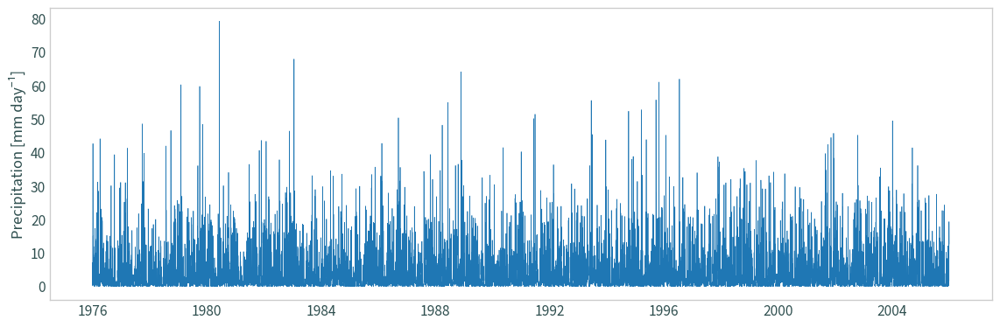

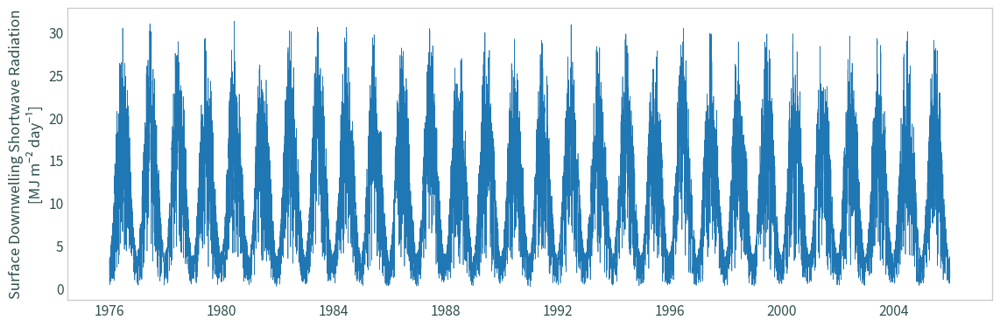

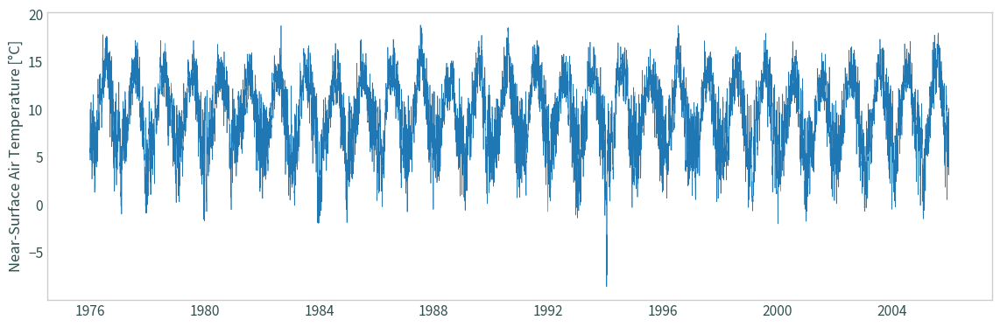

In [40]:
for v in data_ie.data_vars:
    plt.figure(figsize=(12, 4))
    plt.plot(data_ie["time"], data_ie[v], linewidth=.5)
    # plt.xlabel(data_ie["time"].attrs["standard_name"].capitalize())
    # plt.title(cplt.cordex_plot_title(data_ie, lon=LON, lat=LAT))
    if v == "rsds":
        ylabel = (
            f"{data_ie[v].attrs['long_name']}\n[{data_ie[v].attrs['units']}]"
        )
    else:
        ylabel = (
            f"{data_ie[v].attrs['long_name']} [{data_ie[v].attrs['units']}]"
        )
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.show()